# Advance Lane Finding - Udacity
---

## 1. Writeup / README

#### CRITERIA
- Provide a Writeup / README that includes all the rubric points and how you addressed each one.

The files are submitted in the directory containing this write-up.
The files are
* `advanced-lane-finding.ipynb` : a jupyter notebook which contains all the required codes.
* `advanced-lane-finding.html` : a html file exported by the jupyter notebook containing all the execution results.
* `./writeup_images/*` : all the images and video showing the result
* `writeup_advanced_lane.md` : this write-up file

## 2. Camera Calibration

#### CRITERIA
- Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.


I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `object_points` is just a replicated array of coordinates, and `objpoint` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `corners` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.

I then used the output `object_points` and `image_points` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  I applied this distortion correction to the test image using the `cv2.undistort()` function.

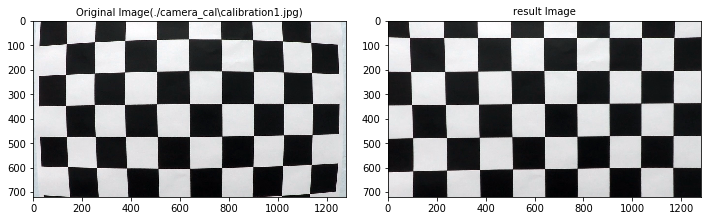

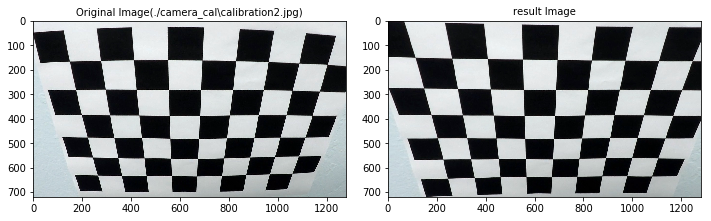

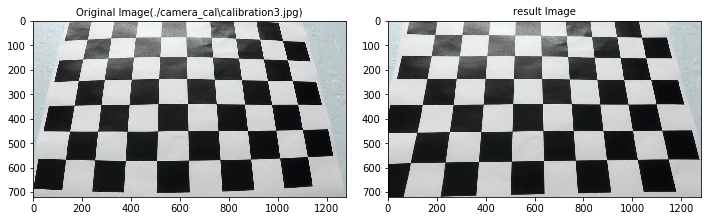

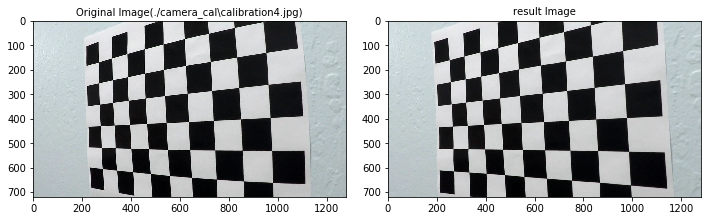

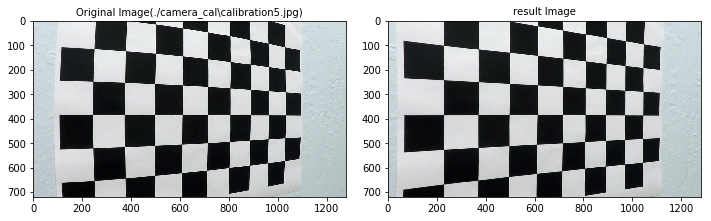

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
%matplotlib inline

# camera calibration
def calibrate_camera(image_files, no_x_dir, no_y_dir, cal_file):
    """
    Calculate Camera calibration coefficients and write them as a python dictionary
    """
    objpoint = np.zeros((no_x_dir * no_y_dir, 3), np.float32)
    objpoint[:, :2] = np.mgrid[0:no_x_dir, 0:no_y_dir].T.reshape(-1, 2)
    
    object_points = []
    image_points = []
    for idx, file_name in enumerate(image_files):
        image = cv2.imread(file_name)
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray_image, (no_x_dir, no_y_dir), None)
        if ret == True:
            object_points.append(objpoint)
            image_points.append(corners)

    image_size = (image.shape[1], image.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, image_size, None, None)
    calibrated_data = {'mtx': mtx, 'dist': dist}

    with open(cal_file, 'wb') as f:
        pickle.dump(calibrated_data, file=f)

imgfiles = glob.glob('./camera_cal/calibration*.jpg')
nx, ny = 9, 6
calibrate_camera(imgfiles, nx, ny, './cal_camera.p')

# get the camera calibration parameters, mtx, dist
with open('./cal_camera.p', 'rb') as f:
    dist_pickle = pickle.load(file=f)
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']


def myshow(imgfile, original, modified, binary = None, imgfile2 = ''):
    if(binary != None):
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 5))                
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    f.tight_layout()
    if imgfile2 == '':
        ax1.set_title('Original Image({})'.format(imgfile), fontsize=10)
        ax2.set_title('result Image', fontsize=10)
    else:
        ax1.set_title('{}'.format(imgfile), fontsize=10)
        ax2.set_title('{}'.format(imgfile2), fontsize=10)
    ax1.imshow(original)
    ax2.imshow(modified)
    if(binary != None):
        ax3.set_title('binary result Image', fontsize=10)
        ax3.imshow(binary)
    plt.show()
    
# Take distorted image and undistort it using saved camera coefficients
imgfiles = glob.glob('./camera_cal/calibration[1-5].jpg')
for imgfile in imgfiles:
    distorted_image = cv2.imread(imgfile)
    undistorted_image = cv2.undistort(distorted_image, mtx, dist)

    myshow(imgfile, distorted_image, undistorted_image)


## 3. Pipeline (test images)

#### CRITERIA
- Provide an example of a distortion-corrected image.

I apply `cv2.undistort()` with camera calibration parameters obtained in the previous section to all the test images.


(720, 1280, 3)


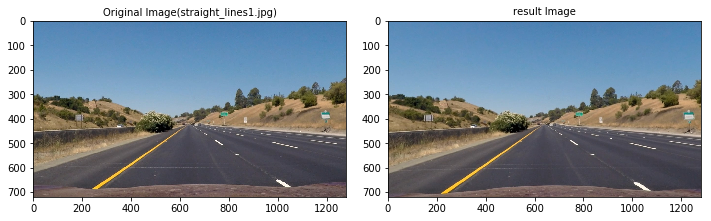

(720, 1280, 3)


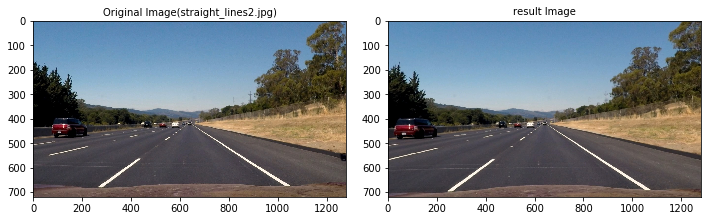

(720, 1280, 3)


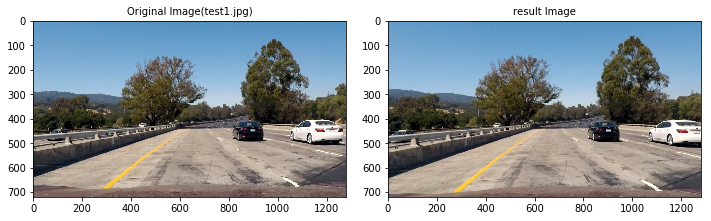

(720, 1280, 3)


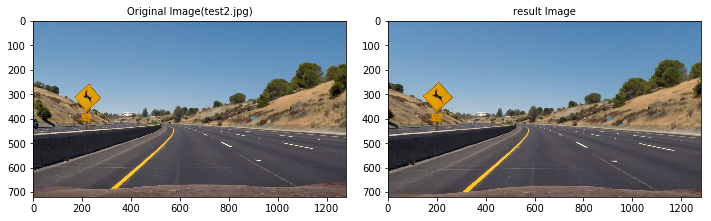

(720, 1280, 3)


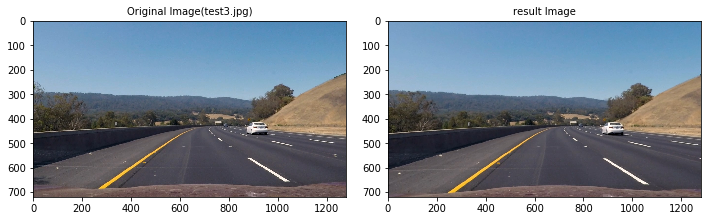

(720, 1280, 3)


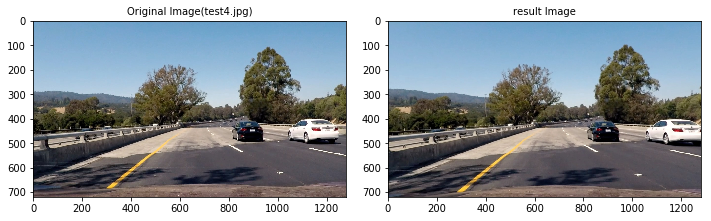

(720, 1280, 3)


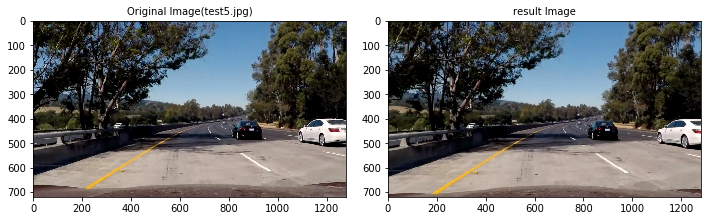

(720, 1280, 3)


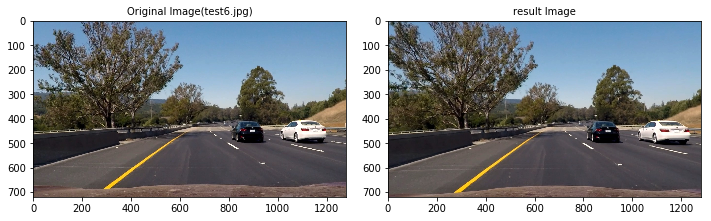

In [2]:
import os

# Take distorted image and undistort it using saved camera coefficients
test_image_dir = './test_images/'
output_image_dir = './output_images/'
images_files = os.listdir(test_image_dir)

for imgfile in images_files:
    distorted_image = plt.imread(test_image_dir + imgfile)
    undistorted_image = cv2.undistort(distorted_image, mtx, dist)
    print(undistorted_image.shape)
    cv2.imwrite(output_image_dir + imgfile, undistorted_image)
    myshow(imgfile, distorted_image, undistorted_image)


#### CRITERIA
- Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

##### COLOR SPACE CONVERSION RESULT

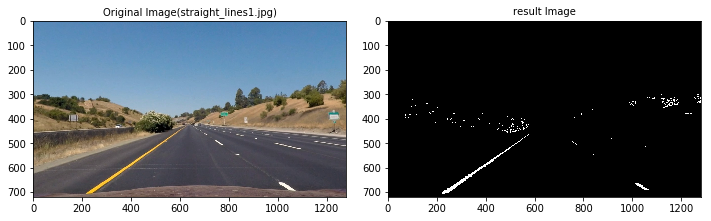

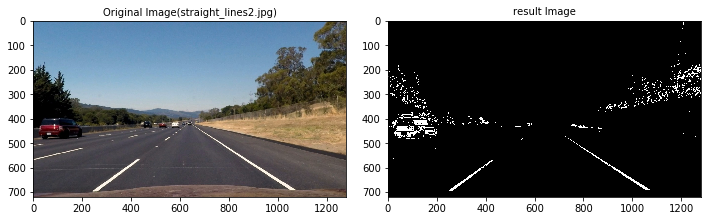

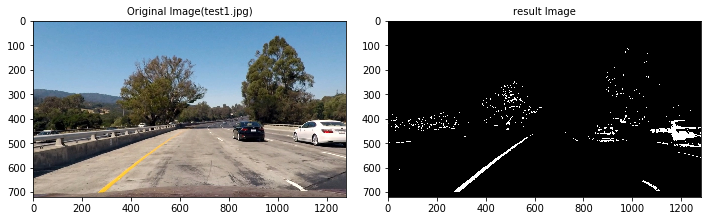

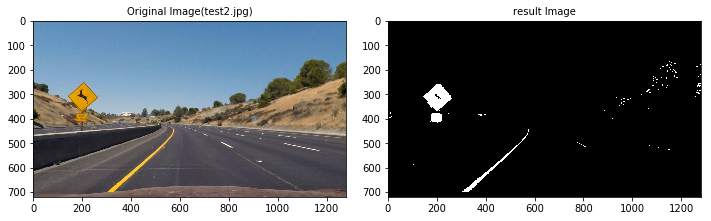

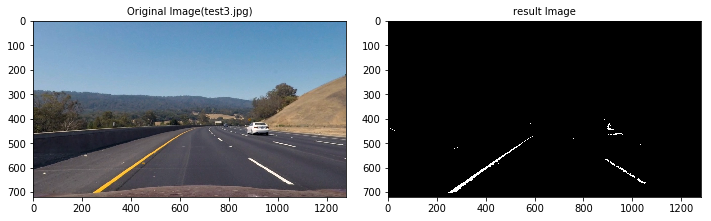

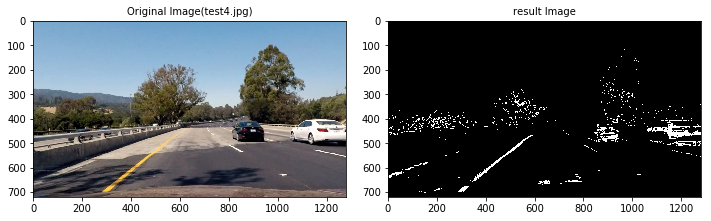

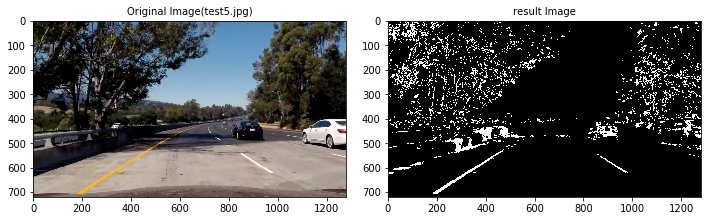

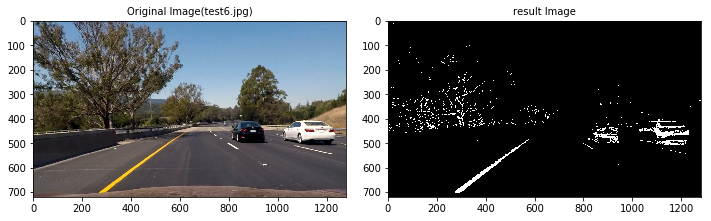

In [3]:
def hls_select(img, thresh=(0, 255)):
    img = np.copy(img)
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_ch = hls[:, :, 2]
    binary = np.zeros_like(s_ch)
    binary[(thresh[0] < s_ch) & (s_ch <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary

for imgfile in images_files:
    image = cv2.imread(output_image_dir + imgfile)
    hls_binary = hls_select(image, thresh=(150, 255))
    hls_binary = 255 * np.dstack((hls_binary, hls_binary, hls_binary)).astype('uint8')
    myshow(imgfile, image, hls_binary)

##### GRADIENTS RESULT

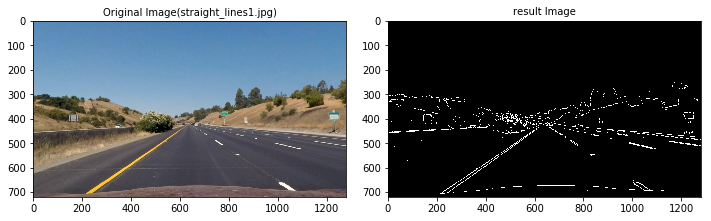

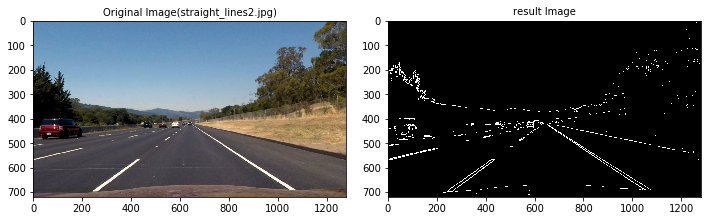

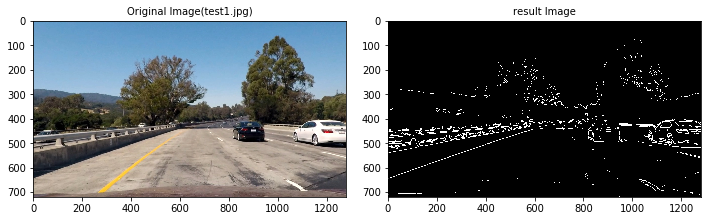

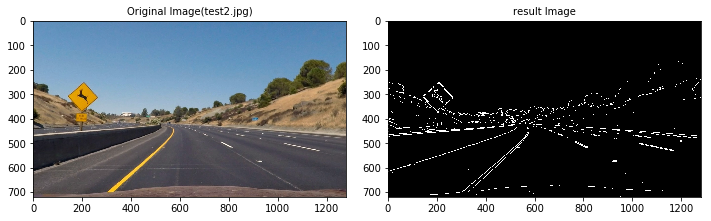

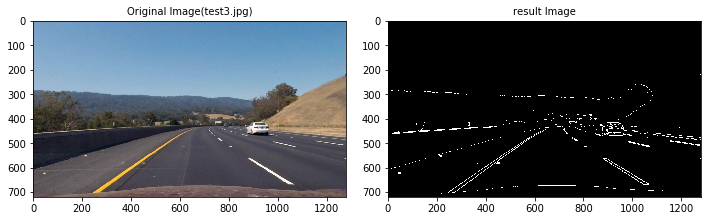

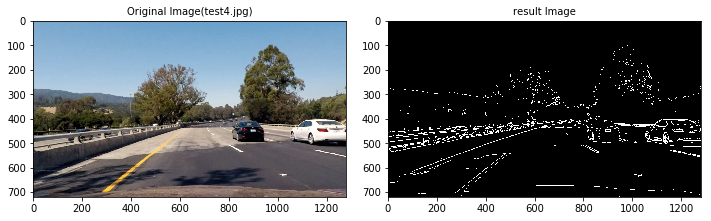

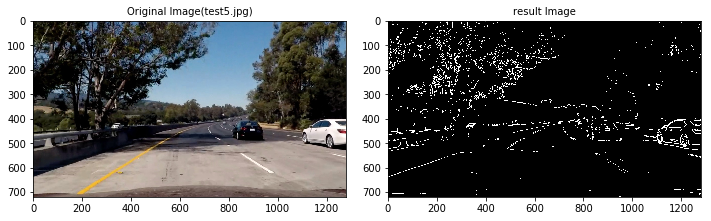

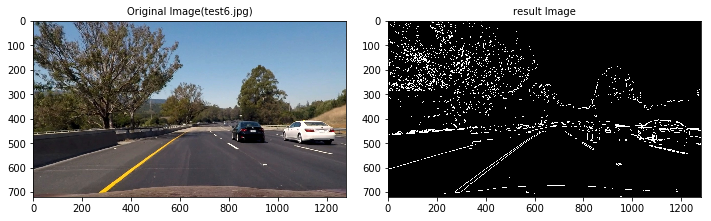

In [4]:
def abs_sobel_thresh(img, orient='x', abs_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x' :
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    else:
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    #    is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= abs_thresh[0]) & (scaled <= abs_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    abs_sobel = np.sqrt(sobelx*sobelx + sobely*sobely)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= mag_thresh[0]) & (scaled <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, 0.2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1]+thresh[0])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

for imgfile in images_files:
    image = cv2.imread(output_image_dir + imgfile)
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', abs_thresh=(30, 255))
    grady = abs_sobel_thresh(image, orient='y', abs_thresh=(50, 255))
    mag_binary = mag_threshold(image, sobel_kernel=ksize, mag_thresh=(60, 255))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.9, 0.1))

    combined = (gradx & grady) | mag_binary
    combined = 255 * np.dstack((combined, combined, combined)).astype('uint8')
    myshow(imgfile, image, combined)


##### COLOR AND GRADIENT CONBINING RESULT
- I used a combination of color and gradient thresholds to generate a binary image (thresholding steps at 3rd cell through 5th cell in `advanced-lane-finding.ipynb`).

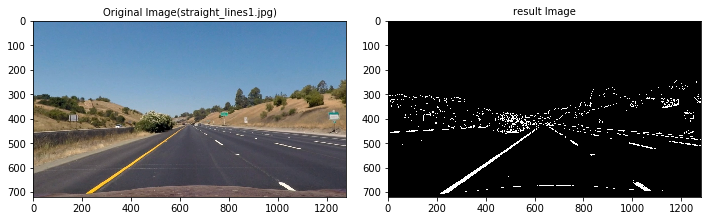

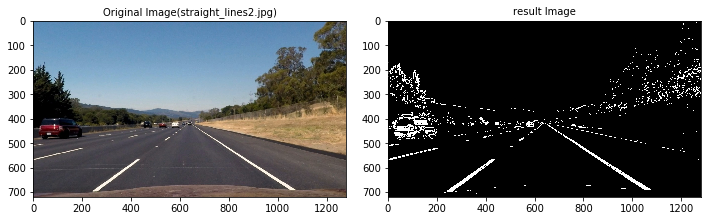

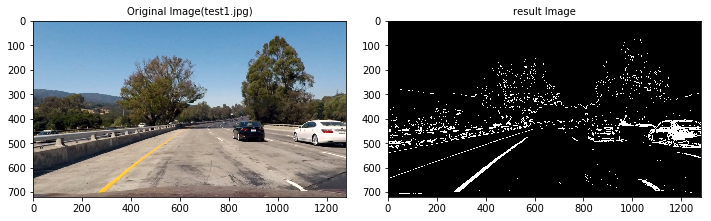

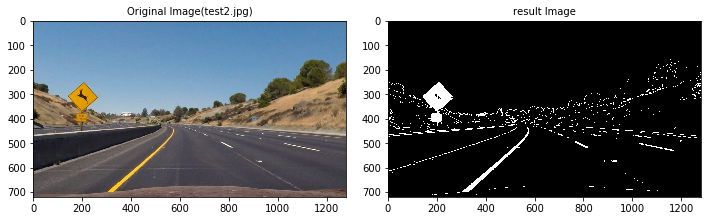

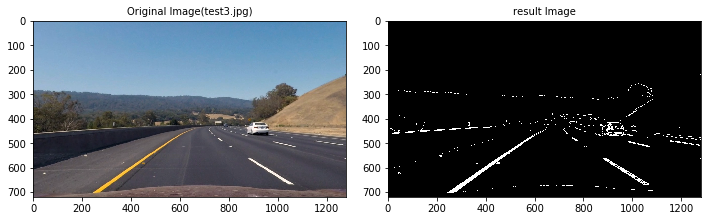

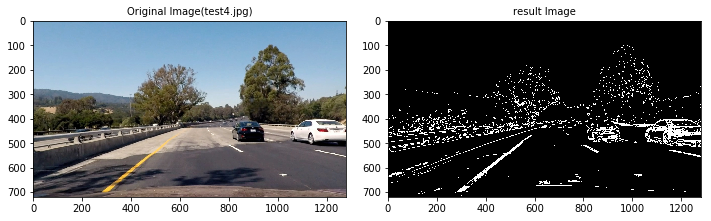

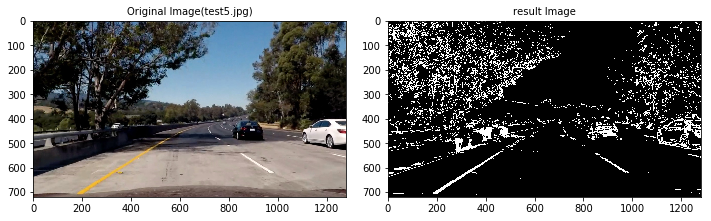

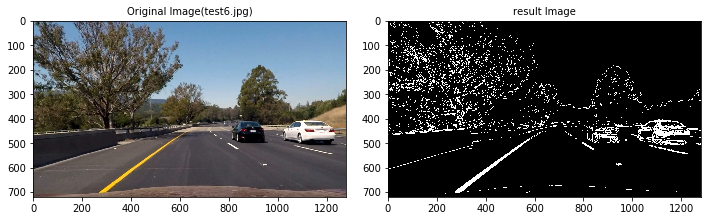

In [5]:
def reduce_noise(image, threshold=4):
    k = np.array([[1, 1, 1],
                  [1, 0, 1],
                  [1, 1, 1]])
    nb_neighbours = cv2.filter2D(image, ddepth=-1, kernel=k)
    image[nb_neighbours < threshold] = 0
    return image

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

def combine_all(image, color_thresh = (155, 255), gradx_thresh = (30, 255), grady_thresh = (25, 255), mag_thresh = (70, 255)): 

    # Apply each of the thresholding functions
    hls_binary = hls_select(image, thresh=color_thresh)
    gradx = abs_sobel_thresh(image, orient='x', abs_thresh=gradx_thresh)
    grady = abs_sobel_thresh(image, orient='y', abs_thresh=grady_thresh)
    mag_binary = mag_threshold(image, sobel_kernel=ksize, mag_thresh=mag_thresh)
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.9, 0.1))

    combined = hls_binary | (gradx & grady) | mag_binary
    combined = 255 * np.dstack((combined, combined, combined)).astype('uint8')
    return combined
    
for imgfile in images_files:
    image = cv2.imread(output_image_dir + imgfile)
    # Apply each of the thresholding functions
    result = combine_all(image)
    result = reduce_noise(result)
    plt.imsave(output_image_dir + 'binary_' + imgfile, result)
    myshow(imgfile, image, result)

#### CRITERIA
- Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

The code for my perspective transform includes a class called `birdsview`, which appears in 6th cell in the file `advanced-lane-finding.ipynb` The `transform()` function in `birdsview` class takes as inputs an image (`image`) and inverse on/off flag. The source(`before`) and destination (`after`) points are required at the class construction call.  I chose the hardcode the source and destination points in the following manner: (`offset` variable is used to trim destination points.)

```
before = np.array([[253, 697],[585,456],[700, 456],[1061,690]], np.int32)
off = 60
offset = np.array([[off, 0],[off, 0],[-off, 0],[-off, 0]], np.int32)
after = np.array([[253, 697], [253, 0], [1061, 0], [1061, 690]] + offset , np.int32)
```

This resulted in the following source and destination points:

| Source        | Destination   |
|:-------------:|:-------------:|
| 253, 697      | 313, 697      |
| 585, 456      | 313, 0        |
| 700, 456      | 1001, 0       |
| 1061, 690     | 1001, 690     |

I verified that my perspective transform was working as expected by drawing the `before` and `after` points onto a test image and its warped counterpart to verify that the lines appear parallel in the warped image.

D:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:45: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
D:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:59: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


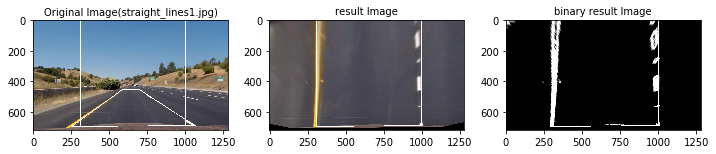

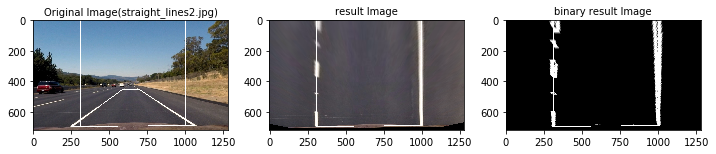

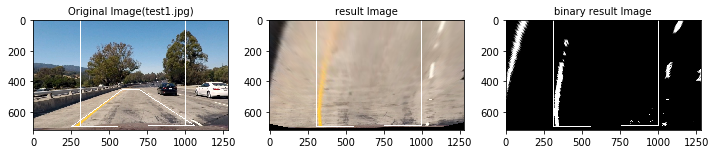

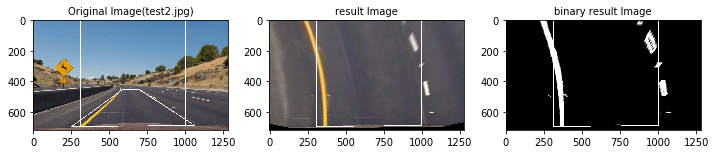

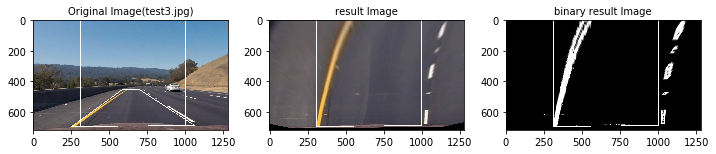

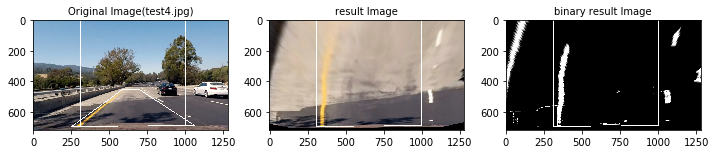

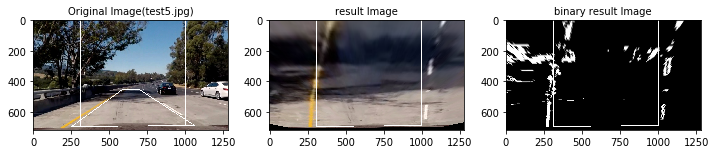

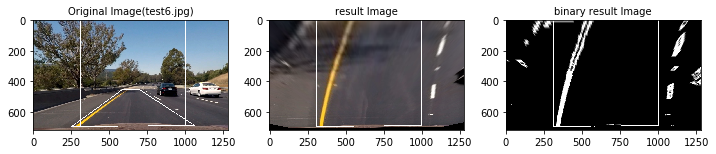

In [6]:
class birdsview:
    def __init__(self, before, after):
        """
        perspective transform wrapper class
        """
        self.M = cv2.getPerspectiveTransform(before, after)
        self.inverse_M = cv2.getPerspectiveTransform(after, before)

    def transform(self, image, direction = 'forward'):
        """
        cv2.warpPerspective() wrapper
        """
        size = (image.shape[1], image.shape[0])
        M = self.M if direction == 'forward' else self.inverse_M
        return cv2.warpPerspective(image, M, size, flags=cv2.INTER_LINEAR)


before = np.array([[253, 697],[585,456],[700, 456],[1061,690]], np.int32)
off = 60
offset = np.array([[off, 0],[off, 0],[-off, 0],[-off, 0]], np.int32)
after = np.array([[253, 697], [253, 0], [1061, 0], [1061, 690]] + offset , np.int32)

src = np.float32(before)
dst = np.float32(after)

perspective = birdsview(src, dst)

before = before.reshape((-1,1,2))
after = after.reshape((-1,1,2))

for imgfile in images_files:
    image = cv2.imread(output_image_dir + imgfile)
    binary_image = cv2.imread(output_image_dir + 'binary_' + imgfile)
    # Apply each of the thresholding functions
    result = perspective.transform(image)
    binary_result = perspective.transform(binary_image)
    cv2.polylines(image, [before], True, color = (255,255,255), thickness = 3)
    cv2.polylines(image, [after], True, color = (255,255,255), thickness = 3)
    cv2.polylines(result, [after], True, color = (255,255,255), thickness = 3)
    plt.imsave(output_image_dir + 'binary_warped_' + imgfile, binary_result)
    cv2.polylines(binary_result, [after], True, color = (255,255,255), thickness = 3)
    myshow(imgfile, image, result, binary_result)


#### CRITERIA
- Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

##### HISTOGRAM SEARCH
First of all, to detect the lane start points, I take the frequency of one in each column which is well described in histogram. The peaks in the histogram indicates the lane starting points.

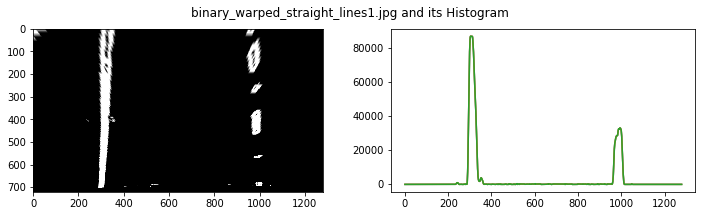

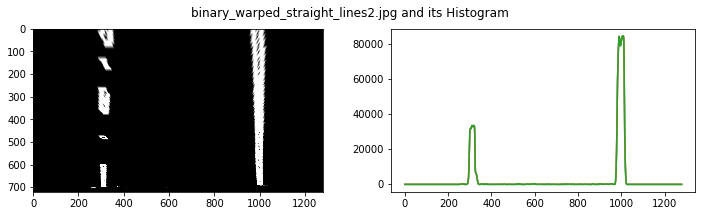

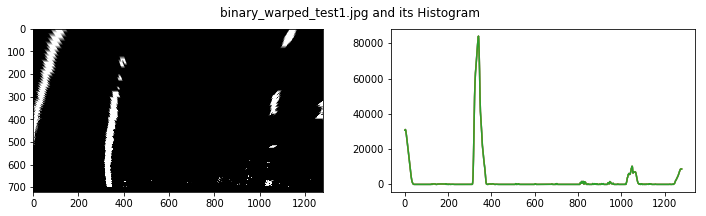

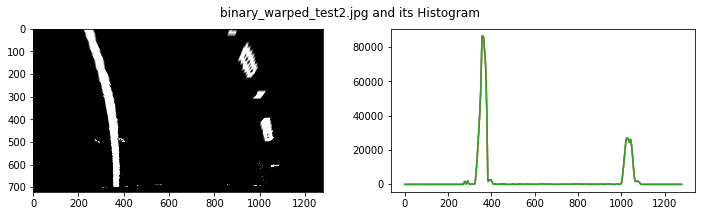

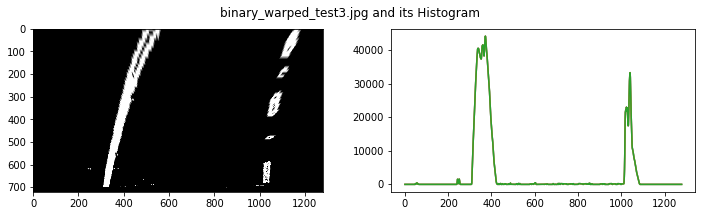

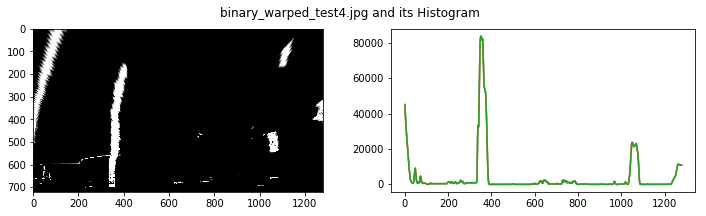

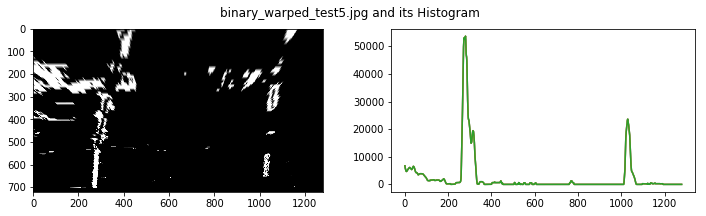

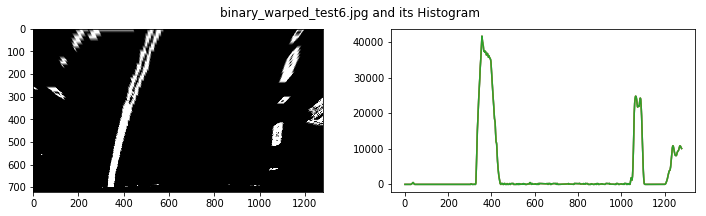

In [13]:
for imgfile in images_files:
    binary_image = cv2.imread(output_image_dir + 'binary_warped_' + imgfile)
    
    histogram = np.sum(binary_image[binary_image.shape[0]//2:,:], axis=0)
    plt.figure(1, figsize=(12, 3))
    plt.subplot(121)
    plt.imshow(binary_image)
    plt.subplot(122)
    plt.plot(histogram)
    plt.suptitle('{}'.format('binary_warped_' + imgfile) + ' and its Histogram')
    plt.show()


##### LANE LINE PIXEL IDENTIFICATION AND POLYNOMIAL FITTING
Then I fitted my lane lines with a 2nd order polynomial. This is a fairly exquisite technique which is not amply explained in the web material. I should have understood the code by myself. I took the codes from the material and wrapped them in a function. The identified lane-line pixels and 2nd order polynomial fitting results are shown in the below.

D:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


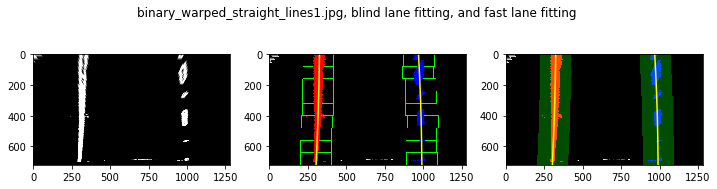

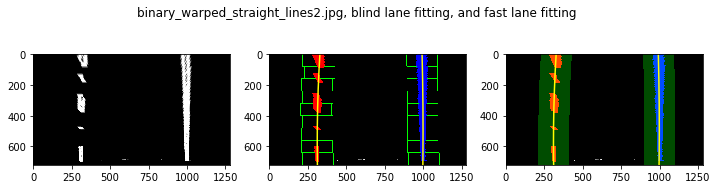

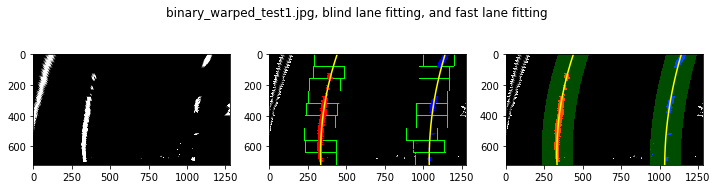

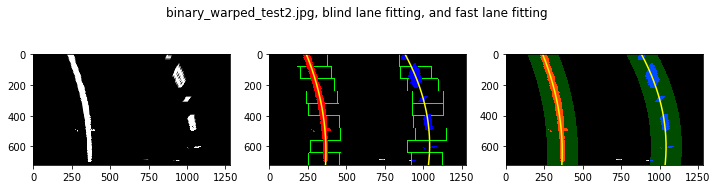

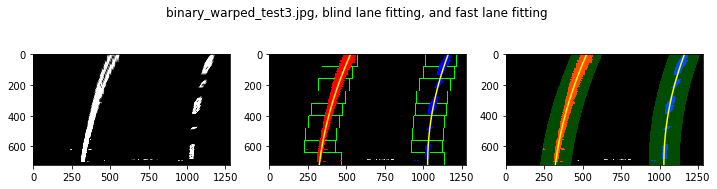

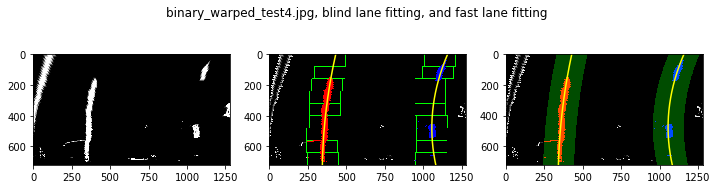

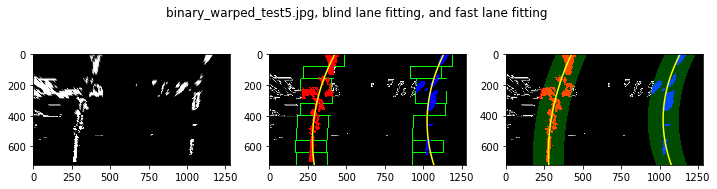

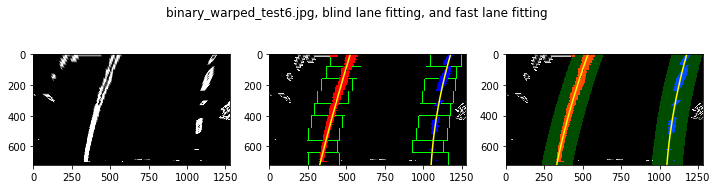

In [9]:
def lane_fit(binary_warped2, nwindows=9, margin=100, minpix=50, visualization = False):
    """
    parameters
     - binary_warped :  warped binary image
     - nwindows : number of sliding windows
     - margin : width of the windows +/- margin
     - minpix : minimum number of pixels found to recenter window
     - visualization : drawing flag
    return
     - {left,right}_fit : fitting coefficients
    """
    # Assuming you have created a warped binary image called "binary_warped"
    binary_warped = np.copy(binary_warped2[:,:,0])
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        if visualization:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Visualization of curve fitting
    # At this point, you're done! But here is how you can visualize the result as well:
    if visualization :
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return left_fit, right_fit, out_img, left_fitx, right_fitx
#Skip the sliding windows step once you know where the lines are
# Now you know where the lines are you have a fit! In the next frame of video you don't need to do a blind search again,
# but instead you can just search in a margin around the previous line position like this:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
def fast_lane_fit(binary_warped2, left_fit, right_fit, margin=100 , visualization = False):
    """
    parameters
     - binary_warped :  warped binary image
     - {left, right}_fit : lane-fitting coefficents
     - margin : width of the windows +/- margin
     - visualization : drawing flag
    return
     - {left,right}_fit : fitting coefficients
    """
    binary_warped = np.copy(binary_warped2[:,:,0])
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                                   left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                                                                         left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +
                                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                                                                           right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    if visualization:
        # And you're done! But let's visualize the result here as well
        # Create an image to draw on and an image to show the selection window
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return left_fit, right_fit, result, left_fitx, right_fitx

for imgfile in images_files:
    binary_image = cv2.imread(output_image_dir + 'binary_warped_' + imgfile)
    
    left_fit0, right_fit0, out_img0, left_fitx0, right_fitx0 = lane_fit(binary_image, visualization = True)
    left_fit1, right_fit1, out_img1, left_fitx1, right_fitx1 = fast_lane_fit(binary_image, left_fit0, right_fit0, visualization = True)
    
    ploty = np.linspace(0, binary_image.shape[0]-1, binary_image.shape[0] )

    plt.figure(1, figsize=(12, 3))
    plt.suptitle('{}'.format('binary_warped_' + imgfile) + ', blind lane fitting, and fast lane fitting')
    plt.subplot(131)
    plt.imshow(binary_image)
    plt.subplot(132)
    plt.imshow(out_img0)
    plt.plot(left_fitx0, ploty, color='yellow')
    plt.plot(right_fitx0, ploty, color='yellow')
    plt.subplot(133)
    plt.imshow(out_img1)
    plt.plot(left_fitx1, ploty, color='yellow')
    plt.plot(right_fitx1, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    

#### CRITERIA
- Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

I did this in 9th cell in `advanced-lane-line.ipynb`. The curvature-measuring formula is explained in [Interactive Mathematics](https://www.intmath.com/applications-differentiation/8-radius-curvature.php) and this is $$([1+((dy)/(dx))^2]^(3//2))/(|(d^2y)/(dx^2)|)$$ at any point <em>x</em> for the curve <span class="intmath"><i>y</i> = <i>f</i>(<i>x</i>)</span>
The measured left and right line curvatures are shown in the following figures as well as the offset in meters from the center point.

D:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


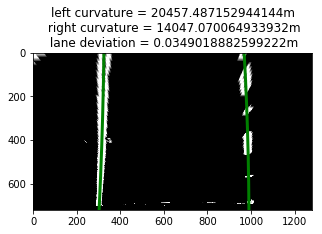

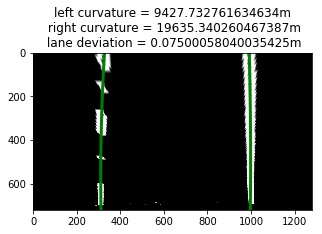

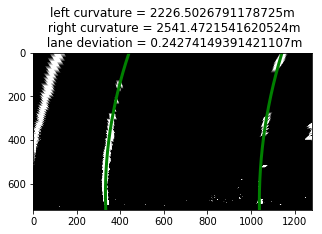

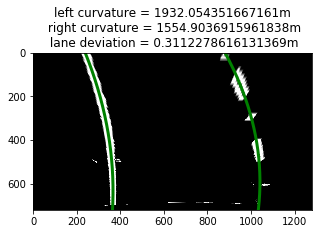

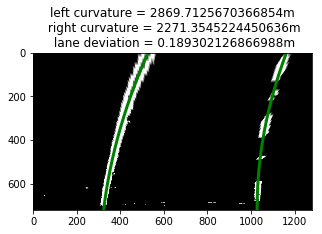

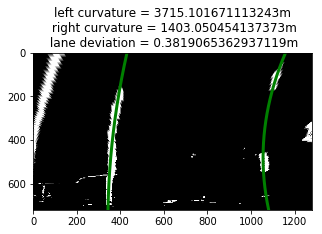

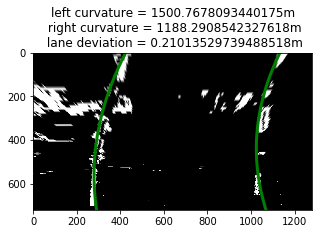

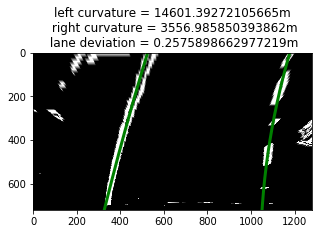

In [10]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def get_radius(y_eval, image_size, left_fit_cr, right_fit_cr):
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # first we calculate the intercept points at the bottom of our image
    left_intercept = left_fit_cr[0] * image_size[0] ** 2 + left_fit_cr[1] * image_size[0] + left_fit_cr[2]
    right_intercept = right_fit_cr[0] * image_size[0] ** 2 + right_fit_cr[1] * image_size[0] + right_fit_cr[2]
    calculated_center = (left_intercept + right_intercept) / 2.0
    lane_deviation = (calculated_center - image_size[1] / 2.0) * xm_per_pix
    return left_curverad, right_curverad, lane_deviation

def get_radius2(y_eval, left_fit_cr, right_fit_cr):
    alpha = (xm_per_pix / ym_per_pix)**2
    beta = xm_per_pix / ((ym_per_pix)**2)
    a, b = left_fit_cr[0], left_fit_cr[1]
    c, d = right_fit_cr[0], right_fit_cr[1]
    left = 1/beta*((1 + alpha*(2*a*y_eval + b)**2)**1.5) / np.absolute(2*a)
    right = 1/beta*((1 + alpha*(2*c*y_eval + d)**2)**1.5) / np.absolute(2*c)
    return left, right

ploty = np.linspace(0, binary_image.shape[0]-1, binary_image.shape[0] )
for imgfile in images_files:
    binary_image = cv2.imread(output_image_dir + 'binary_warped_' + imgfile)
    left_fit0, right_fit0, out_img0, left_fitx0, right_fitx0 = lane_fit(binary_image, visualization = True)
    left_curva, right_curva, deviation = get_radius(np.max(ploty), binary_image.shape, left_fit0, right_fit0)
    
    plt.figure(1, figsize=(5, 3))
    plt.title('left curvature = {}m\n right curvature = {}m\n lane deviation = {}m'.format(left_curva, right_curva, deviation))
    plt.imshow(binary_image)

    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx0, ploty, color='green', linewidth=3)
    plt.plot(right_fitx0, ploty, color='green', linewidth=3)
    plt.gca().invert_yaxis() # to visualize as we do the images

    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()




#### CRITERIA
- Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

I implemented this step in 11th cell in `advanced-lane-finding.ipynb` in the clss `Line`.  Here are my results on all the test images:


D:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


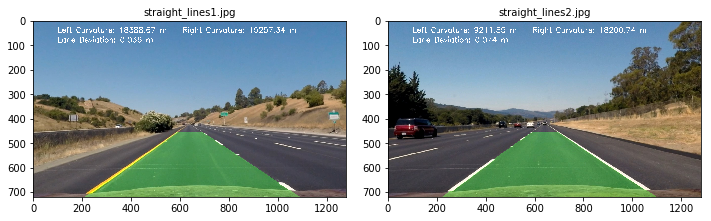

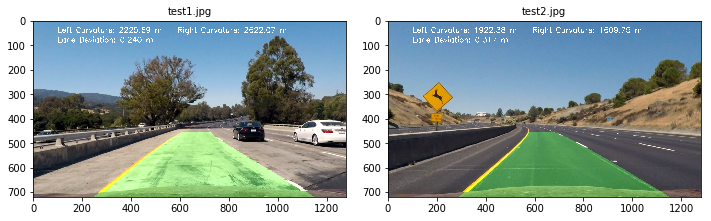

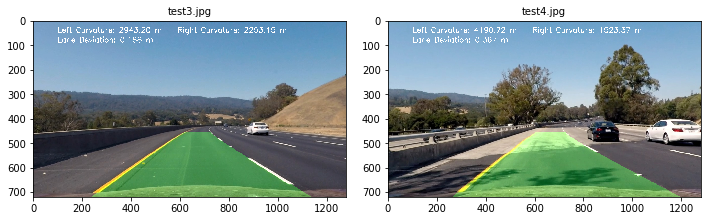

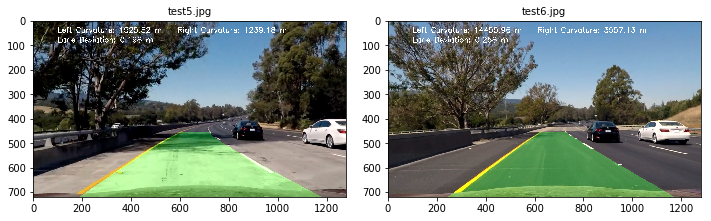

In [11]:
# Define a class to receive the characteristics of each line detection
class Line:
    def __init__(self, cal_file =''):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None; self.bestx_left_buffer = []; self.bestx_right_buffer = []  
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None; self.best_fit_left_buffer = []; self.best_fit_right_buffer = []
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

        # choose a larger odd number to smooth gradient measurements
        global ksize
        ksize = 3 
        if cal_file == '':
            imgfiles = glob.glob('./camera_cal/calibration*.jpg')
            nx, ny = 9, 6
            cal_file = './cal_camera.p'
            calibrate_camera(imgfiles, nx, ny, cal_file)
         
        # get the camera calibration parameters, mtx, dist
        with open(cal_file, 'rb') as f:
            dist_pickle = pickle.load(file=f)
        self.mtx = dist_pickle['mtx']
        self.dist = dist_pickle['dist']
        
        # perspective transform
        before = np.array([[253, 697],[585,456],[700, 456],[1061,690]], np.int32)
        off = 60
        offset = np.array([[off, 0],[off, 0],[-off, 0],[-off, 0]], np.int32)
        after = np.array([[253, 697], [253, 0], [1061, 0], [1061, 690]] + offset , np.int32)

        src = np.float32(before)
        dst = np.float32(after)
        
        self.perspective = birdsview(src, dst)

    def update_fit(self, left_fitx, right_fitx, left_fit, right_fit):
        self.bestx_left_buffer.append(left_fitx)
        self.bestx_right_buffer.append(right_fitx)
        self.best_fit_left_buffer.append(left_fit)
        self.best_fit_right_buffer.append(right_fit)

        if len(self.bestx_left_buffer) >= 12:
            del self.bestx_left_buffer[0]
            del self.bestx_right_buffer[0]
            del self.best_fit_left_buffer[0]
            del self.best_fit_right_buffer[0]
            self.detected == True

    def get_best_fit(self):
        ave_left = np.average(self.best_fit_left_buffer, axis=0)
        ave_right = np.average(self.best_fit_right_buffer, axis=0)
        return ave_left, ave_right
    
    def get_bestx(self):
        ave_left = np.average(self.bestx_left_buffer, axis=0)
        ave_right = np.average(self.bestx_right_buffer, axis=0)
        return ave_left, ave_right
            
    def finding(self, img):
        undistorted_image = cv2.undistort(img, self.mtx, self.dist)
        binary_image = combine_all(undistorted_image)
        binary_image = reduce_noise(binary_image)
        # warped is a warped binary image
        warped = self.perspective.transform(binary_image)
        # left_fitx and right_fitx represent the x and y pixel values of the lines
        if self.detected == False:
            left_fit, right_fit, out_img, left_fitx, right_fitx = lane_fit(warped)
        else:
            left_fit, right_fit, out_img, left_fitx, right_fitx = fast_lane_fit(warped, self.best_fit[0], self.best_fit[1])
        self.update_fit(left_fitx, right_fitx, left_fit, right_fit)
        
        self.best_fit = self.get_best_fit()
        self.bestx = self.get_bestx()
        # ploty is arrays of fitting lines        
        ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
        # curvature information and center offset, all in meters
        left_curva, right_curva, deviation = get_radius(np.max(ploty), warped.shape, self.best_fit[0], self.best_fit[1])
        self.radius_of_curvature = left_curva, right_curva
        self.line_base_pos = deviation
        curvature_text = 'Left Curvature: {:.2f} m    Right Curvature: {:.2f} m'.format(left_curva, right_curva)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(undistorted_image, curvature_text, (100, 50), font, 1, (255, 255, 255), 2)
        deviation_info = 'Lane Deviation: {:.3f} m'.format(deviation)
        cv2.putText(undistorted_image, deviation_info, (100, 90), font, 1, (255, 255, 255), 2)
        
        # Create an image to draw the lines on
        color_warp = np.zeros_like(warped).astype(np.uint8)
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([self.bestx[0], ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([self.bestx[1], ploty])))])
        pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = self.perspective.transform(color_warp, 'inverse')
        # Combine the result with the original image
        result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)
        return result
    
output_image = []
imgfiles = []
for i, imgfile in enumerate(images_files):
    line = Line('./cal_camera.p')
    image = plt.imread(test_image_dir + imgfile)
    imgfiles.append(imgfile)
    output_image.append(line.finding(image))
    if i % 2 == 1:
        myshow(imgfiles[i-1], output_image[i-1], output_image[i], imgfile2 = imgfiles[i])   

## 4. Pipeline (video)

#### CRITERIA
- Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

Here's a [link to my video result](./writeup_images/project_video_result.mp4)

In [12]:
from moviepy.editor import VideoFileClip

output_file = './project_video_result.mp4'
input_file = './project_video.mp4'
line = Line()

clip = VideoFileClip(input_file)
out_clip = clip.fl_image(line.finding) 
out_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video ./project_video_result.mp4
[MoviePy] Writing video ./project_video_result.mp4


100%|█████████████████████████████████████▉| 1260/1261 [04:40<00:00,  4.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_result.mp4 



## 5. Discussion

#### CRITERIA
- Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?

All the necessary techniques are well described in the web materials. So any problems / issues were not seriously encountered during the project.
Following the suggestion in the rubric, I accumulated and averaged many times (12 times in a code) the lane line detection result to signal the robust detection and used that to inform the *a priori* search for the position of the lines in subsequent frames of video. Since then, accumulated lane line coefficients were averaged to get the current values to draw the current lines. Three functions `update_fit()`, `get_best_fit()`, and `get_bestx()` in the class `Line` implements it.
```python
    def update_fit(self, left_fitx, right_fitx, left_fit, right_fit):
        self.bestx_left_buffer.append(left_fitx)
        self.bestx_right_buffer.append(right_fitx)
        self.best_fit_left_buffer.append(left_fit)
        self.best_fit_right_buffer.append(right_fit)
        if len(self.bestx_left_buffer) >= 12:
            del self.bestx_left_buffer[0]
            del self.bestx_right_buffer[0]
            del self.best_fit_left_buffer[0]
            del self.best_fit_right_buffer[0]
            self.detected == True

    def get_best_fit(self):
        ave_left = np.average(self.best_fit_left_buffer, axis=0)
        ave_right = np.average(self.best_fit_right_buffer, axis=0)
        return ave_left, ave_right
    
    def get_bestx(self):
        ave_left = np.average(self.bestx_left_buffer, axis=0)
        ave_right = np.average(self.bestx_right_buffer, axis=0)
        return ave_left, ave_right
```

This has two impacts on the overall performance.
 1. This improves speed and provides a more robust method for rejecting outliers.
 2. This smoothes the lane detection over frames to avoid jitter.

Nonetheless, it was not possible to pass the challenge and harder video test.
